# Inundation History Tool 
* **Compatability:** Notebook currently compatible with the `DEA Sandbox` environment
* **Products used:** 
['ga_ls5t_ard_3'](https://explorer.sandbox.dea.ga.gov.au/ga_ls5t_ard_3),
['ga_ls7e_ard_3'](https://explorer.sandbox.dea.ga.gov.au/ga_ls7e_ard_3),
['ga_ls8c_ard_3'](https://explorer.sandbox.dea.ga.gov.au/ga_ls8c_ard_3),
[BoM Water Data Online](http://www.bom.gov.au/waterdata/)

## Purpose


This tool is used for associating river flow rates with Landsat satellite passes. It filters satellite passes within defined flow bands of interest, removes poor quality satellite data, and also applies a filter to those images on the rising/falling limb. The images are then analysed using the Fisher index and NDWI for water identification in the landscape. 
The tool outputs the images as NetCDF files for use in GIS software.

## Quick use notes

For **issues relating to the script, a tutorial, or feedback** please contact Martin Job at martin.job@mdba.gov.au or David Weldrake at david.weldrake@mdba.gov.au
1. Press shift + enter on cells until a map appears, select the gauge of interest from the map. Make sure to click "done" after you have selected your gauge.
2. The cell under the map gives you three options for defining the extents of your location of interest. Extents can be defined by uploading a shapefile, typing in the coordinates manually, or using the coordinates of the gauge you selected in the previous step. In this same cell define the flow band of interest.
3. Press shift + enter until you get to 'PART 2'. Here you can toggle the satellite passes you wish to analyse and export based on their position on the hydrograph.
5. Download the NetCDF files for import into your preferred GIS software, and inspect the thumbail images for each satellite flyover.
6. OPTIONAL: download any of the plots of interest.
7. OPTIONAL: Download the csv, containing the date of the flyover, gauge reading, and whether you considered it a pass or fail.
8. Go back to the gauge selecting map at the top of the page, rerun this cell, and select a new gauge, repeat the process to get this new data

### Load packages
Load key Python packages and supporting functions for the analysis. This notebook relies on modules called `dea_bom` and `dea_datahandling`, which are located in the `Scripts` directory. 

In [1]:
import sys
import pickle
import xarray as xr
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
from datetime import datetime

import datacube
from datacube import Datacube
from datacube.utils import geometry 
from datacube.utils.geometry import CRS
from datacube.drivers.netcdf import write_dataset_to_netcdf

%matplotlib inline

import warnings
warnings.filterwarnings('ignore', module='datacube')
%load_ext autoreload
%autoreload 2

sys.path.append('../Scripts')
import dea_bom
from dea_datahandling import load_ard

import plotly.graph_objects as go
import matplotlib.dates
import plotly.offline as py

import geopandas as gpd

### Preparing and loading the gauge information from BOM's Water Data Online 

In [2]:
stations_pkl = Path('../Supplementary_data/Inundation_mapping/stations.pkl')

# If cache exists, get station data from cache
if stations_pkl.exists():
    print('Loading from cache')
    stations = pickle.load(open(str(stations_pkl), 'rb'))
else:
    print('Fetching from BoM')
    stations = dea_bom.get_stations()
    pickle.dump(stations, open(str(stations_pkl), 'wb'))

# Filter list to stations with available data
stations_with_data = pickle.load(open(str('../Supplementary_data/Inundation_mapping/stations_with_data.pkl'), 'rb'))
stations = [i for i in stations if i.name in stations_with_data]

# Preview the first five stations loaded
print(f'{len(stations)} stations loaded; e.g.:')
stations[:5]

Loading from cache
4303 stations loaded; e.g.:


[namespace(name='15 MILE @ GRETA STH',
           url='http://bom.gov.au/waterdata/services/stations/403213',
           pos=(-36.61945775, 146.24407214)),
 namespace(name='15 MILE @ WANGARATTA',
           url='http://bom.gov.au/waterdata/services/stations/403239',
           pos=(-36.36666667, 146.2833333)),
 namespace(name='16 Mile Waterhole',
           url='http://bom.gov.au/waterdata/services/stations/913010A',
           pos=(-18.876921, 139.360487)),
 namespace(name='163 Clifton Rd',
           url='http://bom.gov.au/waterdata/services/stations/6131318',
           pos=(-32.97808, 115.90111)),
 namespace(name='18 Mile Swamp HorseX',
           url='http://bom.gov.au/waterdata/services/stations/144005A',
           pos=(-27.49561971, 153.50836409))]

In [3]:
gauge_data_raw, station = dea_bom.ui_select_station(stations,
                                                zoom=5,
                                                center=(-34.72, 143.17));

### Input user preferences for lat, lon, satellite buffer, and flow thresholds

In [4]:
# USER INPUT REQUIRED >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

# There are three options below for defining extents below #

# This block takes the location of the gauge. Comment it out to use:

# lat, lon = station.pos
# lat_low = round((lat - 0.2), 2)
# lat_high = round((lat + 0.2), 2)
# lon_low = round((lon - 0.2), 2)
# lon_high = round((lon + 0.2), 2)

# Or, use your own coordinates, comment out and enter coordinates:
# lat =
# lon =
# lat_low = round((lat - 0.2), 2)
# lat_high = round((lat + 0.2), 2)
# lon_low = round((lon - 0.2), 2)
# lon_high = round((lon + 0.2), 2)

# Or, using a shapefile to define the extents of the area of interest:
vector_file = 'shapefile_inputs/bullatale_creek.shp'
gdf = gpd.read_file(vector_file)
lon_low = round(gdf.bounds.minx,2)
lon_high = round(gdf.bounds.maxx,2)
lat_low = round(gdf.bounds.miny,2)
lat_high = round(gdf.bounds.maxy, 2)

# Set the flow thresholds (lower and higher) that you are interested in (ML/Day)
yaxis_lower_parameter = 12000
yaxis_higher_parameter = 15000

#set the buffer in degrees
buffer = 0.2

### Loading the Landsat passes for the location of interest

The second cell in this block will take up to 5 minutes to run, as it is loading the satellite passes, applying a cloud filter and filtering out passes with poor coverage

In [5]:
try:
    dc_landsat = datacube.Datacube(app='Using_load_ard', env='c3-samples')
except:
    dc_landsat = datacube.Datacube(app='Using_load_ard')

In [6]:
todays_date = str(datetime.today().strftime('%Y-%m-%d'))

query = {
    'x': (lon_low, lon_high),
    'y': (lat_low, lat_high),
    'time': ('1988-01-01', todays_date),
    'measurements': ["nbart_red"],
    'output_crs': 'EPSG:3577',
    'resolution': (-30, 30),
    'group_by': 'solar_day'
}

# Load available data from all three Landsat satellites using the above query
# Please note the two available options below. You can uncomment the min_gooddata and 
# change this value to reflect the minimum good quality pixels to include (0.6 = 60%)
# Changing the ls7_slc_off variable to True will include ls7 passes with the slc failure
ds = load_ard(dc=dc_landsat, 
              products=['ga_ls5t_ard_3', 'ga_ls7e_ard_3', 'ga_ls8c_ard_3'],
              mask_pixel_quality=True,
              min_gooddata=0.60, #Toggle number between 0 and 1 (default is 0.6)
              ls7_slc_off=False, # Change to True to include Ls7 passes with slc failure
              dask_chunks={},
              **query)

../Scripts/dea_datahandling.py:206: UserWarning:

Setting 'min_gooddata' percentage to > 0.0 will cause dask arrays to compute when loading pixel-quality data to calculate 'good pixel' percentage. This can significantly slow the return of your dataset.



Loading ga_ls5t_ard_3 data
    Filtering to 231 out of 595 observations
    Applying pixel quality/cloud mask
    Applying invalid data mask
Loading ga_ls7e_ard_3 data
    Ignoring SLC-off observations for ls7
    Filtering to 54 out of 732 observations
    Applying pixel quality/cloud mask
    Applying invalid data mask
Loading ga_ls8c_ard_3 data
    Filtering to 83 out of 266 observations
    Applying pixel quality/cloud mask
    Applying invalid data mask
Combining and sorting data
    Returning 368 observations as a dask array


### Filtering out passes for dates within the flow bands of interest

In [7]:
# Converting the gauge data to ML/Day and removing Time from datetime
gauge_data = gauge_data_raw
gauge_data["Value"] = pd.to_numeric(gauge_data["Value"], downcast="float")
gauge_data['Value'] = gauge_data['Value']*86.4

In [8]:
#convert Pandas dataframe to xArray for merging with sat data
gauge_data_xr = gauge_data.to_xarray() 

#this is the xArray merge function
merged_data = gauge_data_xr.interp(Timestamp=ds.time) 

#Now define the passes to load based on user input for flow bands of interest
specified_satellite_passes = merged_data.where(((merged_data.Value > yaxis_lower_parameter) & (merged_data.Value < yaxis_higher_parameter)), drop=True)
specified_satellite_passes = specified_satellite_passes.drop('Timestamp')

date_list = specified_satellite_passes.time.values

#Check how many passes you are about to load. Loading over 400 passes may cause the kernal to crash
print("You are about to load this many passes:{}".format(specified_satellite_passes.time.shape[0]))

You are about to load this many passes:38


In [9]:
# load the passes that happened during the specified flow parameters
specified_passes = ds.sel(time=date_list).compute()

### Merging the satellite passes with the gauge data

In [10]:
merged_data_pd = merged_data.to_dataframe()

#Now take all passes and make a pandas dataframe that lists time of all 
# passes and corresponding gauge value
all_specified_passes_pd = specified_passes.time.to_dataframe()
all_specified_passes_pd = all_specified_passes_pd.rename(columns = {'time': 'date'})#can't have 2 columns called time

#Merge all satellite passes with gauge data by the time dimension
all_merged_data = pd.merge(all_specified_passes_pd, merged_data_pd, left_on= 'time', 
                            right_index=True, how='inner')
all_merged_data = all_merged_data.drop(columns='date')
all_merged_data = all_merged_data.drop(columns='Timestamp')

In [11]:
#Graphing all satellite flyovers on the hydrograph
graphing_gauge = gauge_data.reset_index()
graphing_all_merged_data = all_merged_data.reset_index()
graphing_gauge['y_lower'] = yaxis_lower_parameter
graphing_gauge['y_higher'] = yaxis_higher_parameter

fig_all = go.Figure()

fig_all.add_trace(go.Scatter(x =graphing_gauge['Timestamp'], y = graphing_gauge['Value'],
                        mode = 'lines',
                        name = 'Gauge data',
                        line=dict(color='royalblue', width=1)))
fig_all.add_trace(go.Scatter(x = graphing_all_merged_data['time'], y = graphing_all_merged_data['Value'],
                        mode = 'markers',
                        name = 'Satellite pass',
                        line=dict(color='green', width=2)))
fig_all.add_trace(go.Scatter(x =graphing_gauge['Timestamp'], y = graphing_gauge['y_lower'],
                        mode = 'lines',
                        name = 'Minimum flow bound',
                        line=dict(color='black', width=2)))
fig_all.add_trace(go.Scatter(x =graphing_gauge['Timestamp'], y = graphing_gauge['y_higher'],
                        mode = 'lines',
                        name = 'Maximum flow bound',
                        line=dict(color='black', width=2)))

fig_all.update_layout(hovermode="x unified",
                                 title= 'Satellite passes within the flow band of interest',
                                 xaxis_title='Date',
                                 yaxis_title='Flow at gauge (ML/Day)',
                                 font=dict(family='Calibri', size=16, color='black'),
                                 paper_bgcolor='white',
                                 plot_bgcolor='white') 
fig_all.show()
print('There were ', str(len(graphing_all_merged_data)), ' flyovers')

There were  38  flyovers


### Now separate the gauge data into 2 lists: rising and falling. Check the graph in the output to see how well the data was separated

This box will check whether the gauge-reading 21 (can change with user input) days after the satellite pass was higher or lower than the day of the satellite pass. The multiplier represents by how much more the water should be lower or higher to be considered a significant change. This has been defined as 1 for simplicity (can also change with user input). It puts the pass either into the rising or falling list accordingly. It runs a loop to do this for every single pass. The output will tell you how many passes you got in each list and show you how the passes were catagorised on a hydrogaph. 

In [12]:
gauge_data_update = gauge_data.reset_index()
gauge_data_update['Timestamp'] = gauge_data_update['Timestamp'].dt.date
gauge_data_update = gauge_data_update.set_index('Timestamp')

In [13]:
#The multiplier specifies by how much more the flow rate has to rise by to be considered a significant rise
multiplier = 1

#The procedent is how many days in advance the algorithm checks for a rise or fall. 
#one day is not enough beacuse the data is too noisy to just do 1 day. 21 days is suggested. 
days_ahead = 21

#extract the flow rate values from the gauge data for the loop
gauge_data_values = gauge_data_update['Value']

i = 0
rising_list = []
falling_list = []
for value in gauge_data_values[:len(gauge_data_values)-days_ahead]:
    if value < gauge_data_values[i+days_ahead]*multiplier:
        rising_list.append(gauge_data_values.index[i])
    else:
        falling_list.append(gauge_data_values.index[i])
    i = i + 1

#set time in the Timestamp to 00:00:00 to match gauge Timestamps
pass_dates = all_merged_data.index
pass_dates_list = pass_dates.tolist()

ii = 0
pass_list = []
for time in pass_dates_list:
    new_val = datetime.date(pass_dates_list[ii])
    pass_list.append(new_val)
    ii = ii + 1

#match the date lists up to the satellite passes
rising_passes1 = set(rising_list) & set(pass_list)
rising_passes = list(rising_passes1)
falling_passes1 = set(falling_list) & set(pass_list)
falling_passes = list(falling_passes1)

all_merged_data.index = pd.DatetimeIndex(all_merged_data.index.date)
all_merged_data.index.name = 'date'

# Change the list of rising passes into a pandas dataframe with the date as the index
rising_passes_df = pd.DataFrame(rising_passes)
rising_passes_df.columns = ['date']
rising_passes_df['date'] = pd.to_datetime(rising_passes_df['date'])
rising_passes_df['date'] = rising_passes_df['date'].dt.date
rising_passes_df = rising_passes_df.set_index(['date'])
rising_passes_df = rising_passes_df.join(all_merged_data)

# And do the same for falling
falling_passes_df = pd.DataFrame(falling_passes)
falling_passes_df.columns = ['date']
falling_passes_df['date'] = pd.to_datetime(falling_passes_df['date'])
falling_passes_df['date'] = falling_passes_df['date'].dt.date
falling_passes_df = falling_passes_df.set_index(['date'])
falling_passes_df = falling_passes_df.join(all_merged_data)

In [14]:
## Graphing the images on the hydrograph
graphing_rising_passes = rising_passes_df.reset_index()
graphing_rising_passes['date'] = pd.to_datetime(graphing_rising_passes['date'])
graphing_falling_passes = falling_passes_df.reset_index()
graphing_falling_passes['date'] = pd.to_datetime(graphing_falling_passes['date'])

fig_rising_falling = go.Figure()

fig_rising_falling.add_trace(go.Scatter(x =graphing_gauge['Timestamp'], y = graphing_gauge['Value'],
                        mode = 'lines',
                        name = 'Gauge data',
                        line=dict(color='royalblue', width=1)))
fig_rising_falling.add_trace(go.Scatter(x = graphing_rising_passes['date'], y = graphing_rising_passes['Value'],
                        mode = 'markers',
                        name = 'Rising passes',
                        line=dict(color='green', width=2)))
fig_rising_falling.add_trace(go.Scatter(x = graphing_falling_passes['date'], y = graphing_falling_passes['Value'],
                        mode = 'markers',
                        name = 'Falling passes',
                        line=dict(color='red', width=2)))
fig_rising_falling.add_trace(go.Scatter(x =graphing_gauge['Timestamp'], y = graphing_gauge['y_lower'],
                        mode = 'lines',
                        name = 'Minimum flow bound',
                        line=dict(color='black', width=2)))
fig_rising_falling.add_trace(go.Scatter(x =graphing_gauge['Timestamp'], y = graphing_gauge['y_higher'],
                        mode = 'lines',
                        name = 'Maximum flow bound',
                        line=dict(color='black', width=2)))

fig_rising_falling.update_layout(hovermode="x unified",
                                 title= 'Satellite passes broken into rising/falling categories',
                                 xaxis_title='Date',
                                 yaxis_title='Flow at gauge (ML/Day)',
                                 font=dict(family='Calibri', size=16, color='black'),
                                 paper_bgcolor='white',
                                 plot_bgcolor='white') 

print("number of rising passes(green): {}".format(len(graphing_rising_passes)))
print("number of falling passes(red): {}".format(len(graphing_falling_passes)))
print('''Here's a graph showing the passes that were characterised as rising or falling.''')

fig_rising_falling.show()

number of rising passes(green): 15
number of falling passes(red): 23
Here's a graph showing the passes that were characterised as rising or falling.


In [15]:
rising_master = rising_passes_df.drop(['spatial_ref_x'], axis = 1)
rising_master = rising_master.drop(['spatial_ref_y'], axis = 1)
rising_master['pass/fail'] = 'pass'

falling_master = falling_passes_df.drop(['spatial_ref_x'], axis = 1)
falling_master = falling_master.drop(['spatial_ref_y'], axis = 1)
falling_master['pass/fail'] = 'fail'

master_df = pd.concat([rising_master, falling_master])

master_df = master_df.reset_index()
master_df['date'] = pd.to_datetime(master_df['date'].dt.date)
master_df = master_df.set_index('date')

# PART 2 - Outputting the maps


## Manual check of satellite passes you would like to analyse
The program has split the satellite passes into the rising and falling limb and allocated them to a 'pass' and 'fail' category respectively. Only the satellite passes in the 'pass' category will be analysed. View the graph below, and click on the satellite passes you would like the reclassify, and the program will reclassify them for you.

In [16]:
corrected_master_df = master_df.reset_index()

In [17]:
# USER INPUT REQUIRED >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# >>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

def SetColour(x):
    # Function to allocate a colour to the 
    # sat pass depending on how it is classified
    if(x == 'pass'):
        return "green"
    else:
        return "red"


trace_1 = go.Scatter(x = corrected_master_df['date'], y = corrected_master_df['Value'],
                        mode = 'markers',
                        name = 'satellite pass',
                        marker = dict(size=8, 
                                      color=list(map(SetColour,corrected_master_df['pass/fail']))),
                        showlegend = False)
trace_2 = go.Scatter(x =graphing_gauge['Timestamp'], y = graphing_gauge['Value'],
                        mode = 'lines',
                        name = 'Gauge data',
                        line=dict(color='royalblue', width=1))
trace_3 = go.Scatter(x =graphing_gauge['Timestamp'], y = graphing_gauge['y_lower'],
                        mode = 'lines',
                        name = 'Minimum flow bound',
                        line=dict(color='black', width=2))
trace_4 = go.Scatter(x =graphing_gauge['Timestamp'], y = graphing_gauge['y_higher'],
                        mode = 'lines',
                        name = 'Maximum flow bound',
                        line=dict(color='black', width=2))
trace_5 = go.Scatter(x=[None], y=[None],
                     mode = 'markers',
                     marker = dict(size=8,
                                  color= 'green'),
                    name = 'pass',
                    showlegend = True)
trace_6 = go.Scatter(x=[None], y=[None],
                     mode= ' markers',
                     marker = dict(size=8,
                                  color= 'red'),
                    name = 'fail',
                    showlegend = True)

passing_failing_graph = go.FigureWidget(data=[trace_1, trace_2, trace_3, trace_4, trace_5, trace_6])

scatter = passing_failing_graph.data[0]

def update_point(trace, points, selector):
    # Function to reclassify satellite pass when 
    # the user clicks on a point on the graph below
    try:
        date = points.xs[0]
        row_name = corrected_master_df.loc[corrected_master_df['date'] == date] 
        if row_name['pass/fail'].iloc[0] == 'pass':
            corrected_master_df.loc[corrected_master_df['date'] == date, 'pass/fail'] = "fail"
            with passing_failing_graph.batch_update():
                scatter.marker.color = list(map(SetColour,corrected_master_df['pass/fail']))
            print('the satellite pass on ', date, ' has been reclassified as a fail')
        elif row_name['pass/fail'].iloc[0] == 'fail':
            corrected_master_df.loc[corrected_master_df['date'] == date, 'pass/fail'] = "pass"
            with passing_failing_graph.batch_update():
                scatter.marker.color = list(map(SetColour,corrected_master_df['pass/fail']))
            print('the satellite pass on ', date, ' has been reclassified as a pass')
    except IndexError:
        print('You missed the satellite pass! Try click again')
        
scatter.on_click(update_point)

passing_failing_graph.update_layout(hovermode="x unified",
                                   title= 'Proposed satellite passes to use in the analysis',
                                   xaxis_title='Date',
                                   yaxis_title='Flow at gauge (ML/Day)',
                                   font=dict(family='Calibri', size=16, color='black'),
                                   paper_bgcolor='white',
                                   plot_bgcolor='white') 

print('''Here is the proposed pass/fail split. Check these carefully. If you want to change the
      classification, click on the satellite pass you think has been misclassified
      and the program will reclassify it for you.''')

passing_failing_graph

Here is the proposed pass/fail split. Check these carefully. If you want to change the
      classification, click on the satellite pass you think has been misclassified
      and the program will reclassify it for you.


FigureWidget({
    'data': [{'marker': {'color': [green, green, green, green, green, green,
                  …

In [19]:
# Make a subset of the above master table to include only 
# those in the 'pass' category

is_in = corrected_master_df['pass/fail']=='pass'
passes_df = corrected_master_df[is_in]

In [20]:
try:
    dc_landsat = datacube.Datacube(app='Using_load_ard', env='c3-samples')
except:
    dc_landsat = datacube.Datacube(app='Using_load_ard')

2002-09-24 00:00:00
2002-09-24
Loading ga_ls5t_ard_3 data
    No data for ga_ls5t_ard_3
Loading ga_ls7e_ard_3 data
    Ignoring SLC-off observations for ls7
    Filtering to 1 out of 1 observations
    Applying pixel quality/cloud mask
    Applying invalid data mask
Loading ga_ls8c_ard_3 data
    No data for ga_ls8c_ard_3
Combining and sorting data
    Returning 1 observations 
***THIS FILE NAME ALREADY EXISTS, PLEASE SAVE YOUR NETCDF FILES TO ANOTHER DIRECTORY***


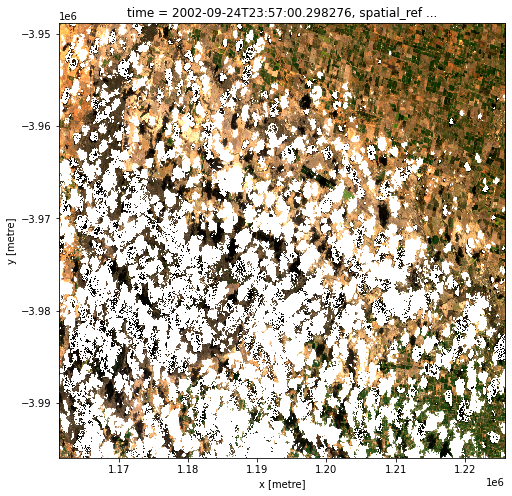

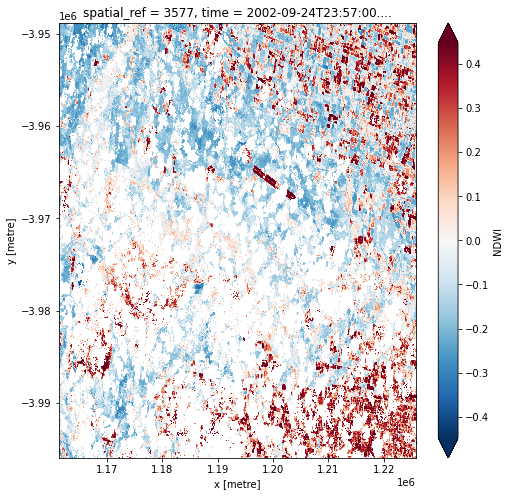

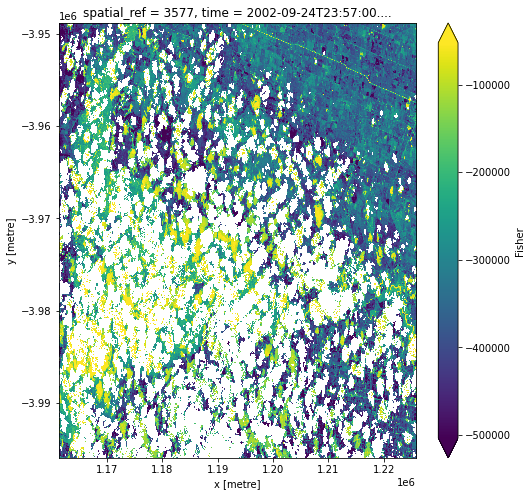

In [21]:
for i in passes_df['date']:
    print(i)
    date_string = str(i.date())
    print(date_string)
    file_extension = '.nc'
    file_name = 'netcdf_outputs/' + date_string + file_extension
    # Create a reusable query
    query = {
        'x': (lon_low, lon_high),
        'y': (lat_low, lat_high),
        'time': (date_string),
        'measurements': ['nbart_red', 'nbart_green', 'nbart_blue', 
                         'nbart_nir', 'nbart_swir_1', 'nbart_swir_2'],
        'output_crs': 'EPSG:3577',
        'resolution': (-30, 30),
        'group_by': 'solar_day'
    }

    # Load available data from all three Landsat satellites
    ds = load_ard(dc=dc_landsat, 
                  products=['ga_ls5t_ard_3', 'ga_ls7e_ard_3', 'ga_ls8c_ard_3'],
                  mask_pixel_quality=True,
                  min_gooddata=0.60,
                  ls7_slc_off=False, ## comment this to keep the images with the SLC error
                  **query)
    
    # Shows an RGB thumbnail of each pass:
    ds[['nbart_red', 'nbart_green', 'nbart_blue']].isel(time=0).to_array().plot.imshow(robust=True, figsize=(8, 8))
    
    # Making an NDWI layer and showing a thumbnail of the output
    ds_ndwi = (ds.nbart_nir - ds.nbart_swir_1) /(ds.nbart_nir + ds.nbart_swir_1)
    ds["NDWI"] = ds_ndwi
    ds['NDWI'].isel(time=0).plot.imshow(robust=True, figsize=(8, 8))
    
    # Making the fisher index layer and showing a thumbnail of the output
    ds_fisher = 1.7204+(171*ds.nbart_green)+(3*ds.nbart_red)-(70*ds.nbart_nir)-(45*ds.nbart_swir_1)-(71*ds.nbart_swir_2)
    ds['Fisher'] = ds_fisher  
    ds['Fisher'].isel(time=0).plot.imshow(robust=True, figsize=(8, 8))
    
    # Write the layers to a NetCDF, ready for importing
    try:
        write_dataset_to_netcdf(ds, file_name)
    except RuntimeError:
        print('***THIS FILE NAME ALREADY EXISTS, PLEASE SAVE YOUR NETCDF FILES TO ANOTHER DIRECTORY***')
        break
    

#### Optional outputs 

In [ ]:
# Outputting hydrograph 1: all satellite flyovers on the gauge data:
py.plot(fig_all,filename='hydrograph_outputs/all_passes_plot.html')

In [ ]:
# Outputting hydrograph 2: satellite passes divided into rising and falling cats with gauge data
py.plot(fig_rising_falling,filename='hydrograph_outputs/rising_falling_plot.html')

In [ ]:
# Outputting hydrograph 3: satellite passes divided into the 
# final pass/fail categories with gauge data:
py.plot(passing_failing_graph, filename='hydrograph_outputs/pass_fail_plot.html')

In [ ]:
#Exporting the dataframe to the csv
corrected_master_df.to_csv("csv_outputs/all_fly_overs.csv")